In [1]:
# Specify the folder to be plotted
root_path= f'../demo/example/N=200, D_0=0.01, J=1.0, v_0=0.5, aligned_init=1, delta_t=0.5, dt=0.01'
root_path= f'../demo/example/N=200, D_0=1, J=1.0, v_0=0.5, aligned_init=1, delta_t=0.5, dt=0.01'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import json
import os


# --- Load Data ---
def load_txt(filename):
    data = np.loadtxt(filename, skiprows=0)
    return data.T[:, :-1]  # remove last row if it's NaN

x = load_txt(os.path.join(root_path, 'x.txt'))
y = load_txt(os.path.join(root_path, 'y.txt'))
f_x = load_txt(os.path.join(root_path, 'f_x.txt'))
f_y = load_txt(os.path.join(root_path, 'f_y.txt'))

## Reading input parameters of the simulation
with open(os.path.join(root_path, 'input.json'), 'r') as f:
    params = json.load(f)

N = params.get('N')
L_box_x = params.get('L_box_x')
L_box_y = params.get('L_box_y')
v_0 = params.get('v_0')
dt = params.get('dt')
interval = params.get('interval')
Obs_time_steps = params.get('Obs_time_steps')

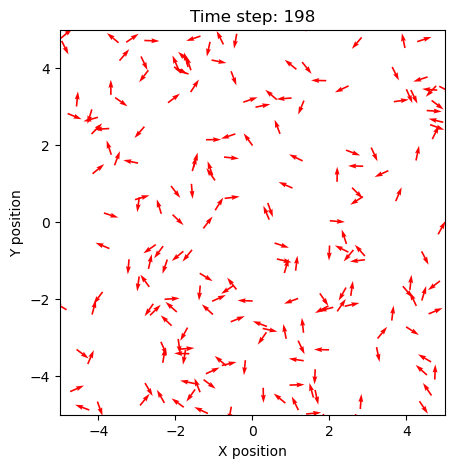

In [3]:
# Movie with quiver plot
from IPython.display import clear_output

time_steps=np.array(x).shape[1]
k_interval =1
k_range = np.arange(0, time_steps)

for k in k_range:
    if k % k_interval != 0:
        continue
    clear_output(wait=True)
    fig1=plt.figure(figsize=(5,5))
    plt.clf()
    q1=plt.quiver(x[:, k], y[:, k], f_x[:, k], f_y[:, k], color='red')
    plt.axis('square')
    plt.xlim(-L_box_x/2, L_box_x/2)
    plt.ylim(-L_box_y/2, L_box_y/2)
    plt.title(f'Time step: {k}')
    plt.xlabel('X position')
    plt.ylabel('Y position')
    plt.show()



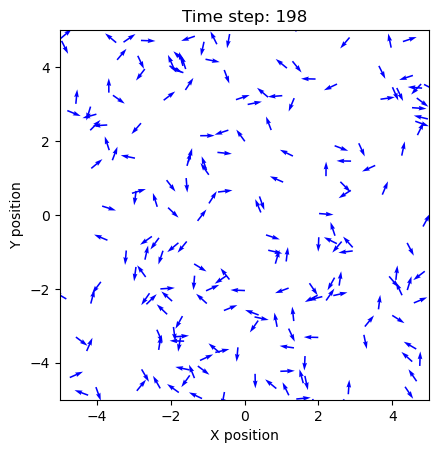

In [4]:
## Animation with quiver plot
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig, ax = plt.subplots()
quiver = ax.quiver(x[:, 0], y[:, 0], f_x[:, 0], f_y[:, 0], color='blue')
ax.set_xlim(-L_box_x/2, L_box_x/2)
ax.set_ylim(-L_box_y/2, L_box_y/2)
ax.set_aspect('equal')
ax.set_xlabel('X position')
ax.set_ylabel('Y position')

def update(k):
    quiver.set_UVC(f_x[:, k], f_y[:, k])
    quiver.set_offsets(np.c_[x[:, k], y[:, k]])
    ax.set_title(f'Time step: {k}')
    return quiver,

ani = animation.FuncAnimation(fig, update, frames=x.shape[1], interval=50, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())
